In [1]:
import pickle
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from distance_result import DistanceResult
from utils import get_pwdf_per_condition, get_melted_df_per_perturbation
from utils import get_flat_df, normalize_per_metric, get_distance_per_perturbation, add_rank_col
from utils import get_ranked_df_per_perturbation, calc_rank_percentile  # sensitivity plots
from utils import plt_legend

sc.set_figure_params(dpi=100, frameon=False, facecolor=None)

[rank: 0] Global seed set to 0


ryp2 is not installed. Install with pip install rpy2 to run tools with R support.

To use sccoda or tasccoda please install ete3 with pip install ete3

In [2]:
%load_ext autoreload
%autoreload 2

In [395]:
%%time
with open('metric_runs_simulated.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['100-pca-n_cells', '100-lognorm-n_cells', '100-counts-n_cells', '200-pca-n_cells', '200-lognorm-n_cells', '200-counts-n_cells', '300-pca-n_cells', '300-lognorm-n_cells', '300-counts-n_cells', '400-pca-n_cells', '400-lognorm-n_cells', '400-counts-n_cells', '500-pca-n_cells', '500-lognorm-n_cells', '500-counts-n_cells', '600-pca-n_cells', '600-lognorm-n_cells', '600-counts-n_cells', '10-lognorm-n_genes', '10-counts-n_genes', '10-pca-n_genes', '50-lognorm-n_genes', '50-counts-n_genes', '50-pca-n_genes', '100-lognorm-n_genes', '100-counts-n_genes', '100-pca-n_genes', '500-lognorm-n_genes', '500-counts-n_genes', '500-pca-n_genes', '1000-lognorm-n_genes', '1000-counts-n_genes', '1000-pca-n_genes', '5000-lognorm-n_genes', '5000-counts-n_genes', '5000-pca-n_genes', '5-pca-perc_ctrl', '5-lognorm-perc_ctrl', '5-counts-perc_ctrl', '10-pca-perc_ctrl', '10-lognorm-perc_ctrl', '10-counts-perc_ctrl', '15-pca-perc_ctrl', '15-lognorm-perc_ctrl', '15-counts-perc_ctrl', '20-pca-perc_ctrl', '20

In [396]:
metrics = list(results.values())[0].metrics
metrics

['kl_divergence',
 'wasserstein',
 'mmd',
 'r2_distance',
 'euclidean',
 'spearman_distance',
 'pearson_distance',
 'mean_absolute_error',
 't_test']

In [5]:
controls = ['control0', 'control1', 'control2', 'control3', 'control4']

In [336]:
# %load plotting_util.py
def plot(tags, plot=True):
    label_tag = tags[0]
    
    pwdfs = {}
    for k, res in results.items():
        if all(t in k for t in tags):
            pwdfs.update(res.pwdfs)
    
    if len(pwdfs) < 2:
        raise ValueError(f'Conditions {tags} were not run.')
        
    individually_ranked = get_ranked_df_per_perturbation(pwdfs, metrics, controls, label_tag)
    ctrl_ranks = calc_rank_percentile(individually_ranked, controls)

    if plot:
        melted_df = get_flat_df(pwdfs, label=label_tag)
        plt.figure(figsize=(10, 5))
        sns.lineplot(data=normalize_per_metric(melted_df), x=label_tag, y='avg_dist', hue='metric')
        plt.ylabel('relative avg dist');
        if 'n_genes' in label_tag:
            plt.xscale('log')
        plt_legend()
        plt.title(f'distance behavior w.r.t {label_tag} in {tags[1]} space')
        plt.show()

        plt.figure(figsize=(10, 5))
        sns.lineplot(data=ctrl_ranks, x=label_tag, y='rank', hue='metric')
        plt.ylabel('control rank percentile')
        plt.ylim(-.05, 1)
        plt_legend()
        plt.title(f'sensitivity w.r.t. {label_tag} in {tags[1]} space')
        plt.show()
    
    return pwdfs, ctrl_ranks


In [256]:
len(set(results['5000-lognorm-n_genes'].adata.obs_names) - set(results['300-lognorm-n_cells'].adata.obs_names))

4973

In [250]:
len(set(results['5000-lognorm-n_genes'].adata.var_names) - set(results['300-lognorm-n_cells'].adata.var_names))

0

## n_cells

Calculate and visualize change in distance due to sample size.

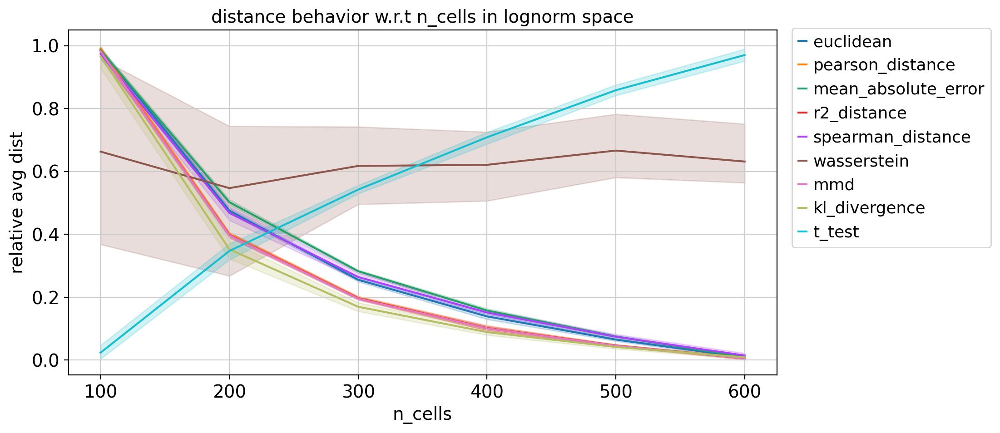

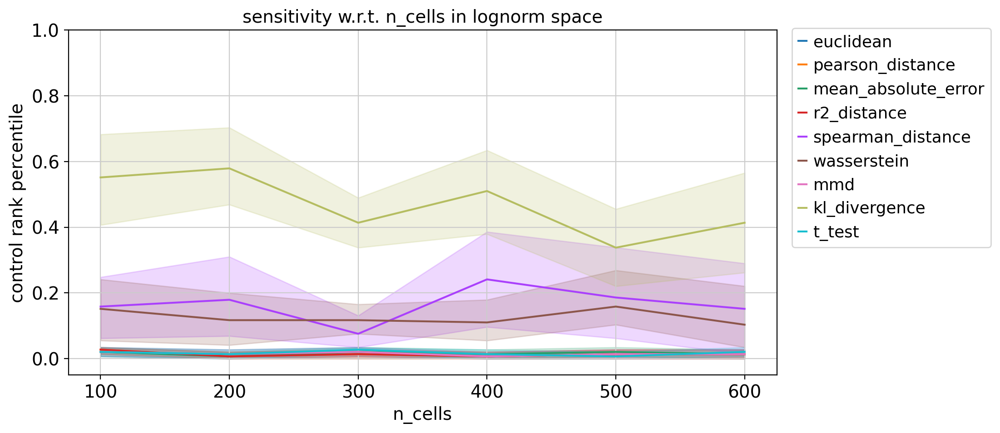

In [400]:
pwdfs, ctrl_ranks = plot(['n_cells', 'lognorm'])

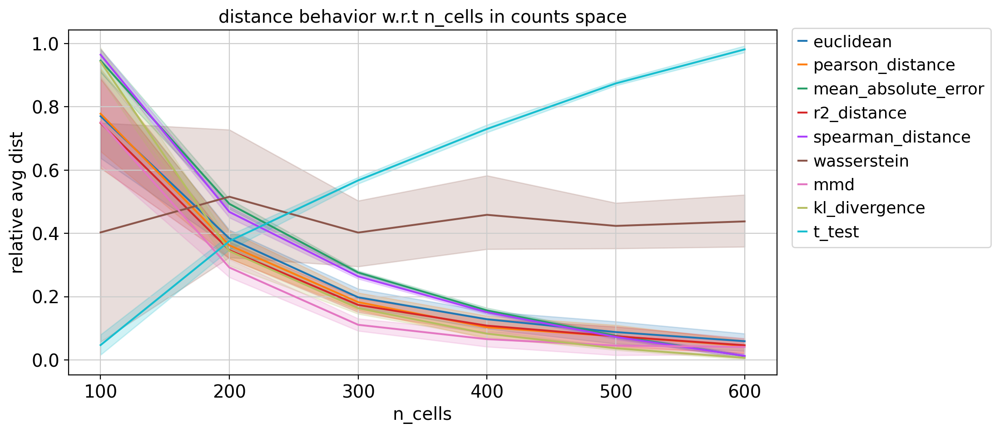

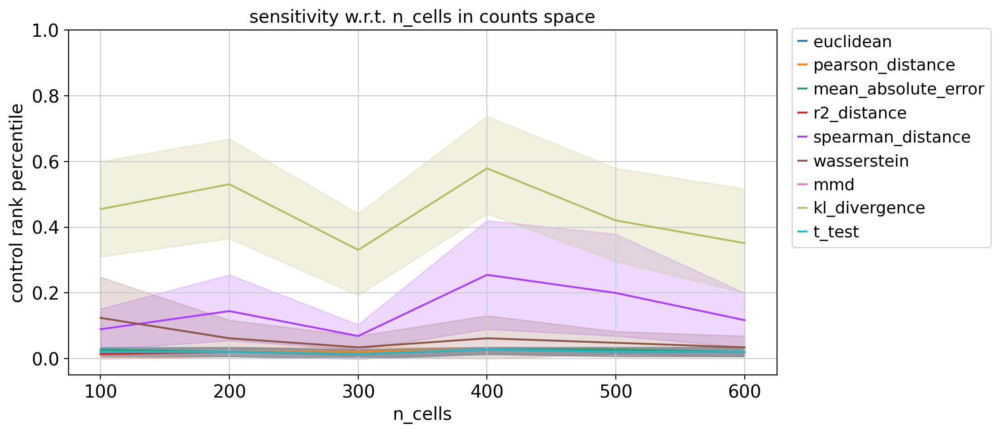

In [401]:
pwdfs, ctrl_ranks = plot(['n_cells', 'counts'])

Small changes in the control population lead to noisy shifts for these three metrics.

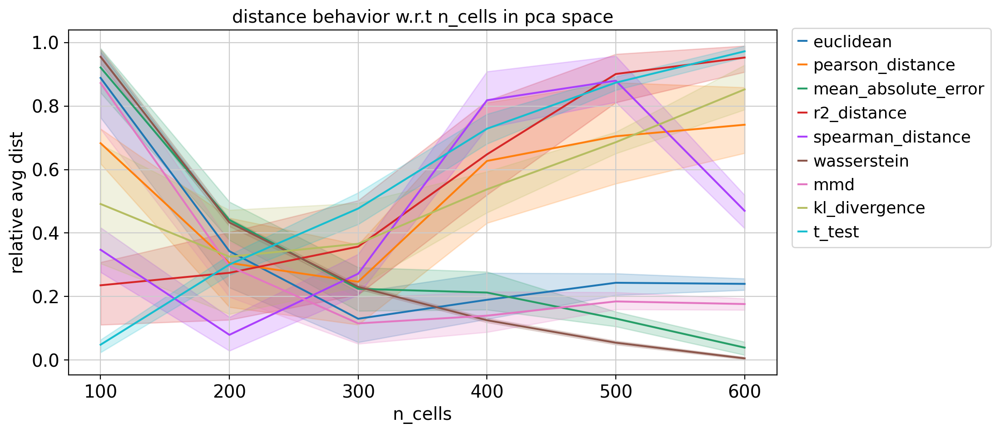

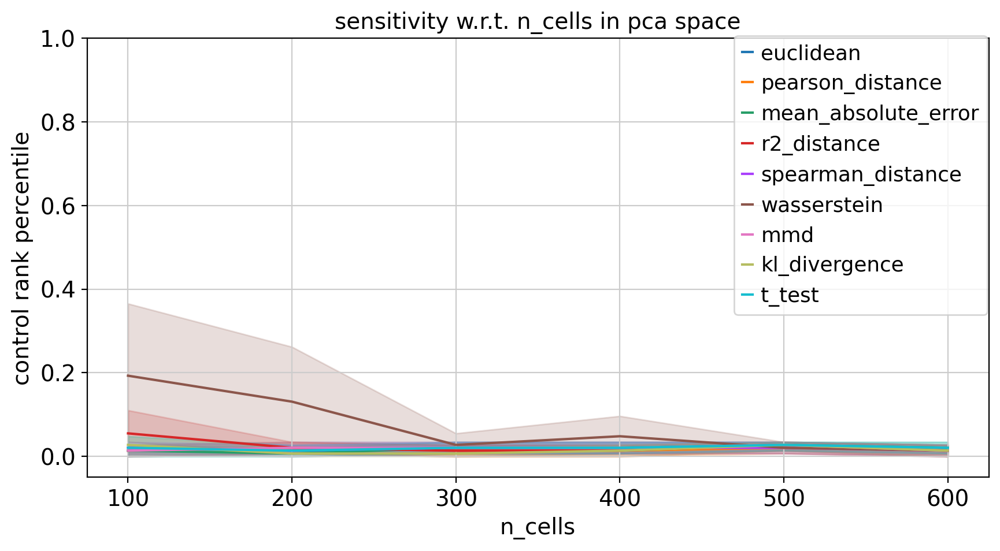

In [402]:
pwdfs, ctrl_ranks = plot(['n_cells', 'pca'])

## n highly variable genes

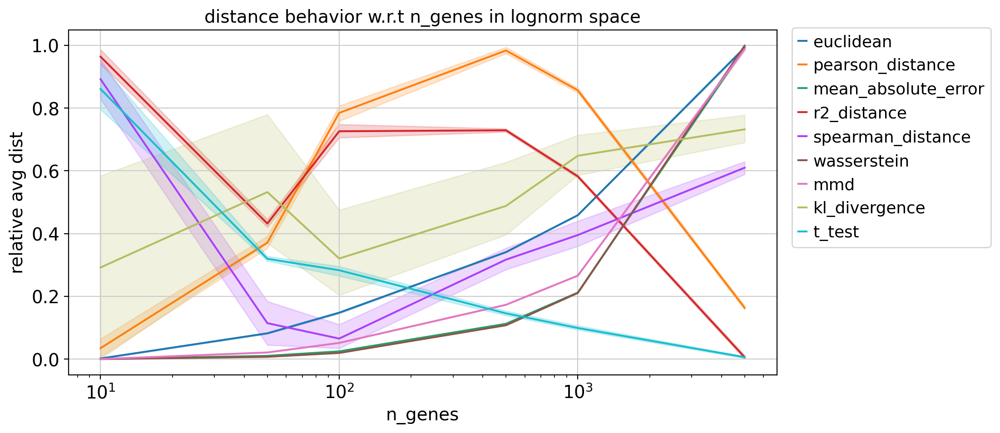

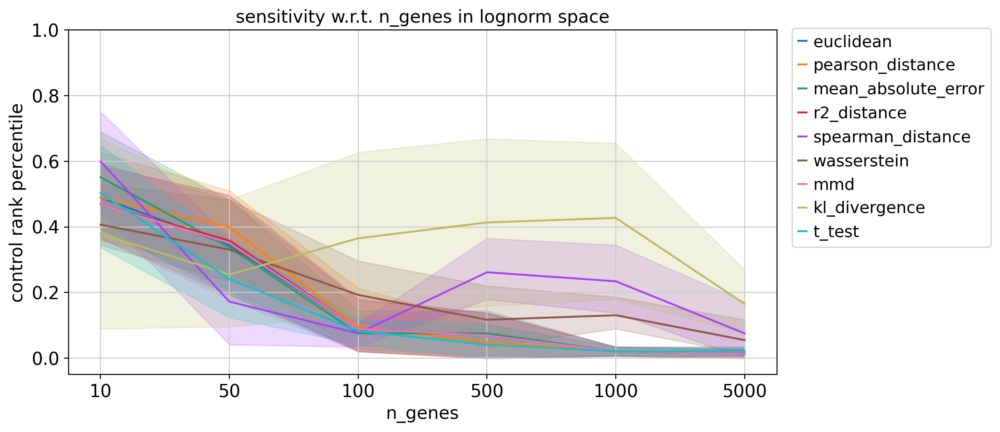

In [397]:
pwdfs, ctrl_ranks = plot(['n_genes', 'lognorm'])

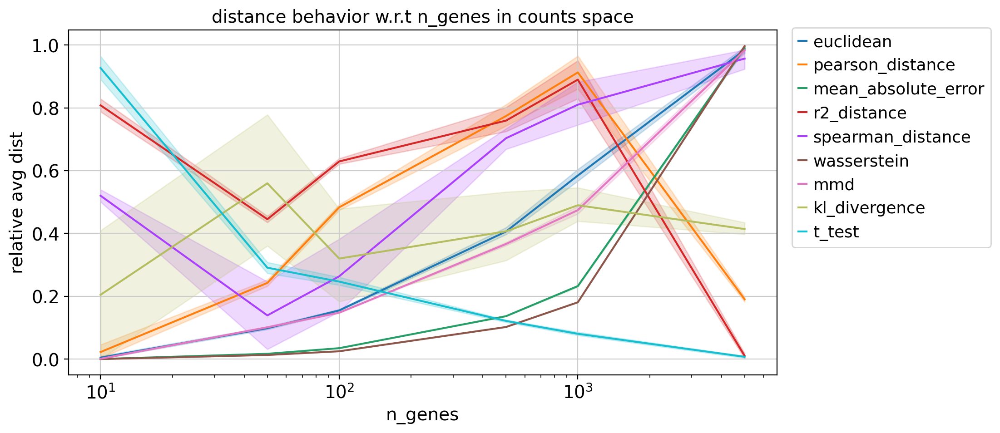

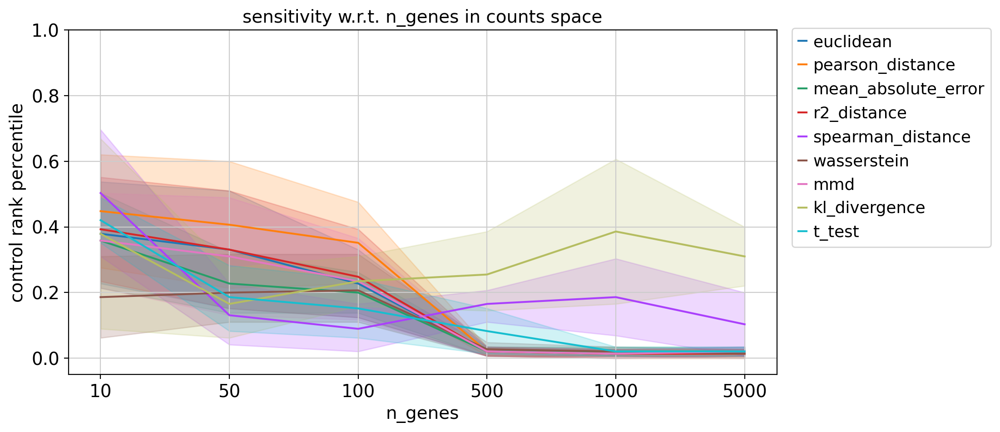

In [398]:
pwdfs, ctrl_ranks = plot(['n_genes', 'counts'])

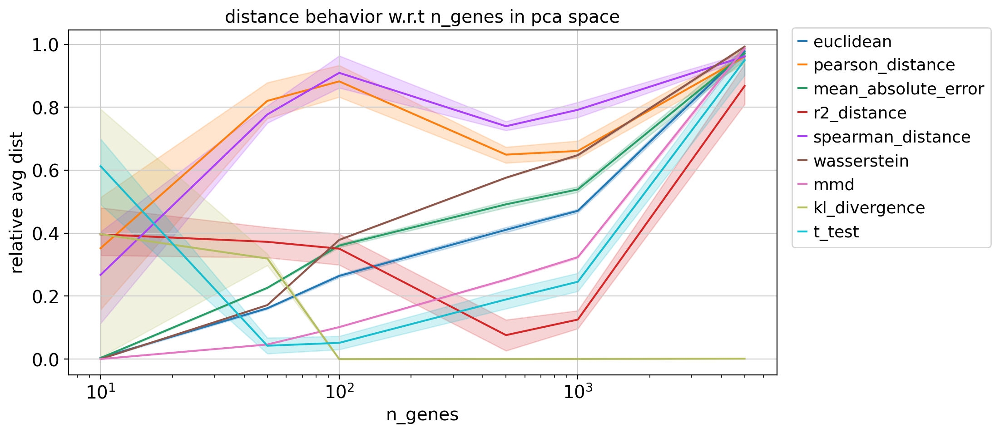

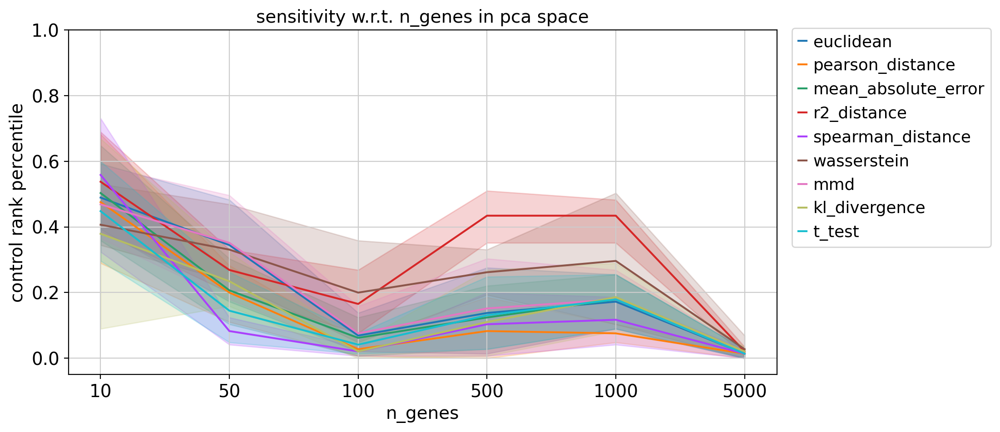

In [399]:
pwdfs, ctrl_ranks = plot(['n_genes', 'pca'])

## n differentially expressed genes

In [227]:
pwdfs, ctrl_ranks = plot(['n_DEGs', 'lognorm'])

AttributeError: 'DataFrame' object has no attribute 'metric'

<Figure size 1000x500 with 0 Axes>

## percent control contamination

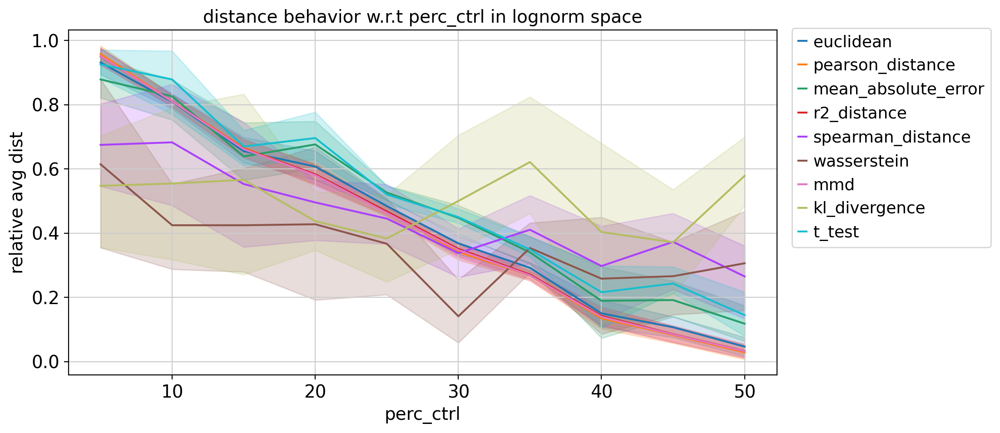

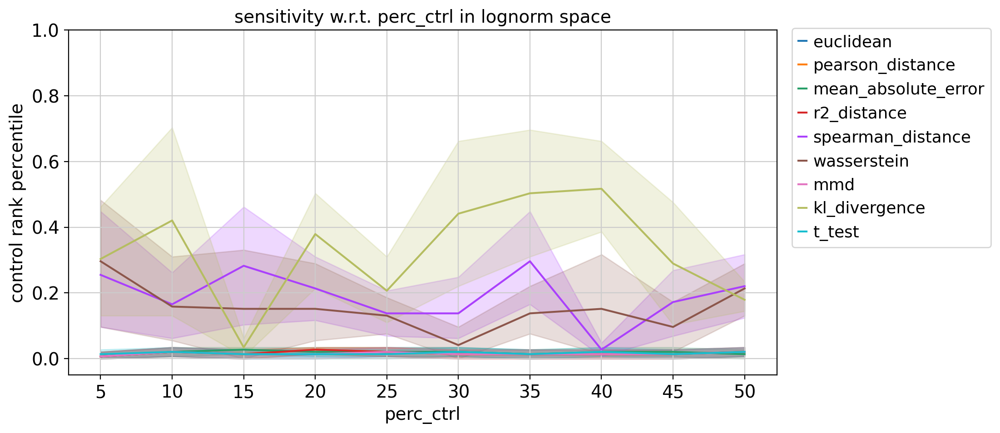

In [403]:
pwdfs, ctrl_ranks = plot(['perc_ctrl', 'lognorm'])

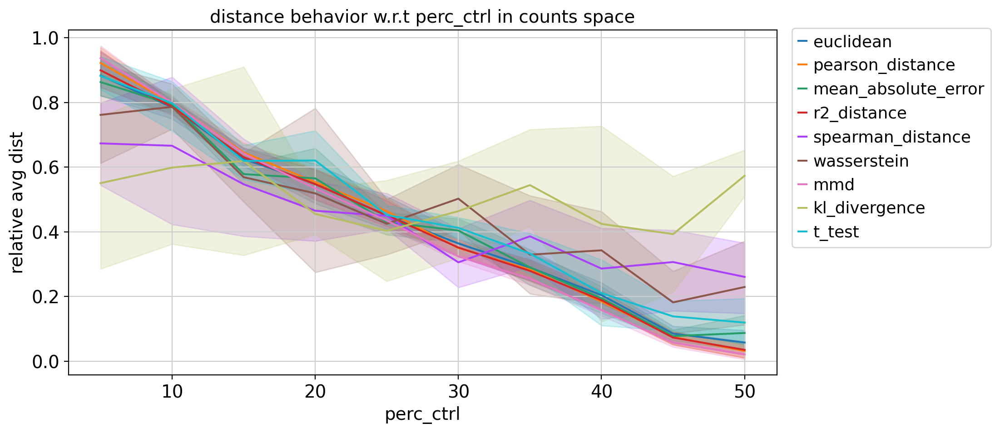

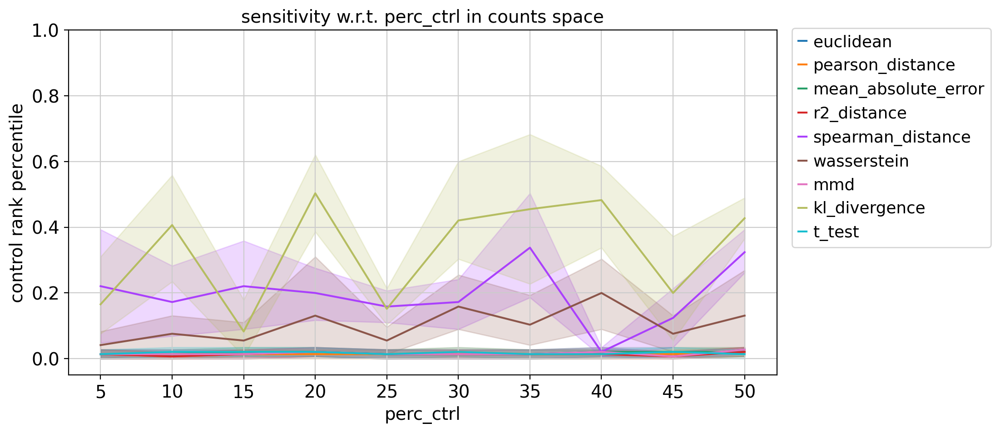

In [404]:
pwdfs, ctrl_ranks = plot(['perc_ctrl', 'counts'])

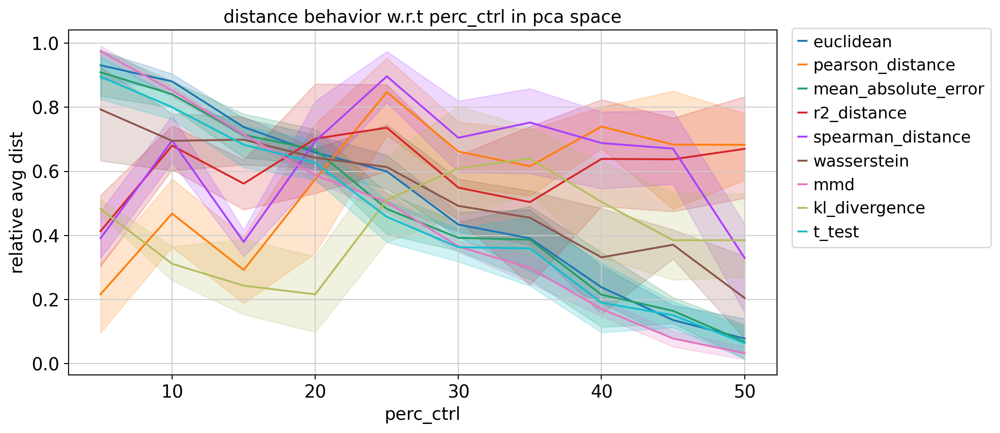

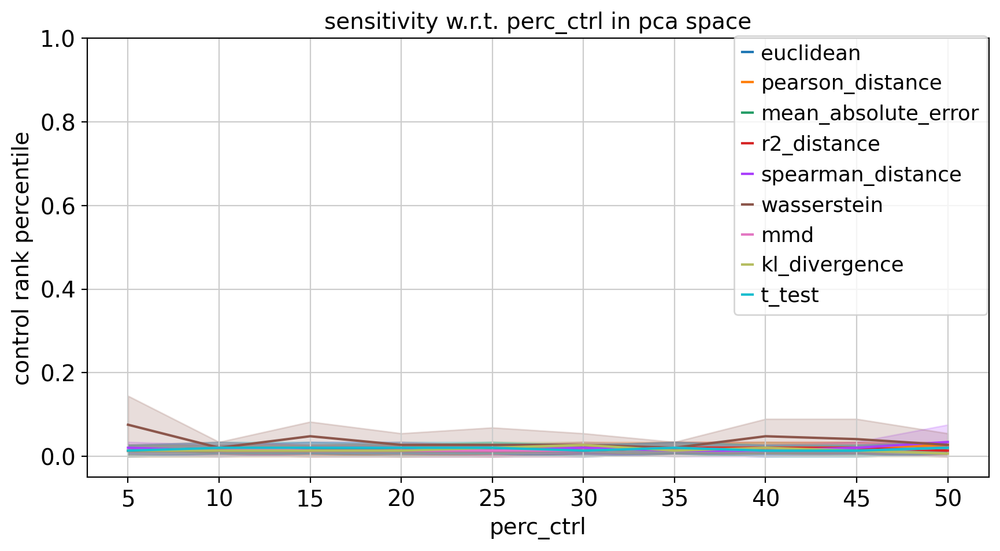

In [405]:
pwdfs, ctrl_ranks = plot(['perc_ctrl', 'pca'])

## library size

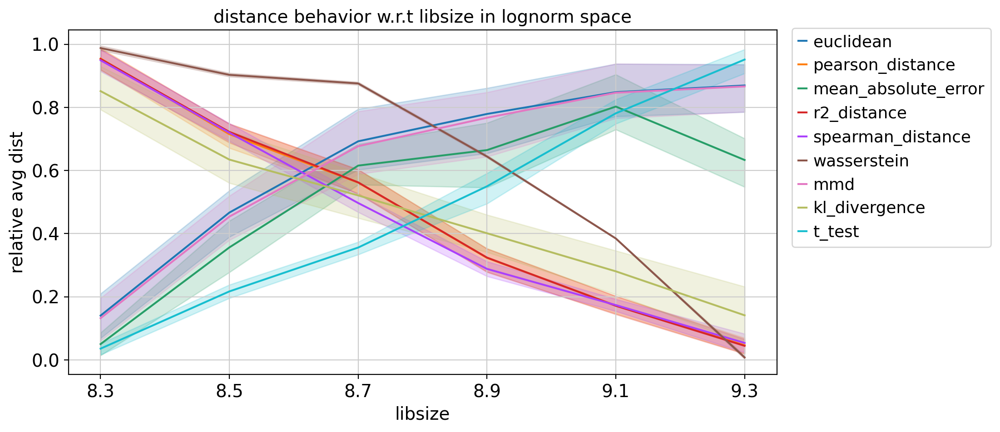

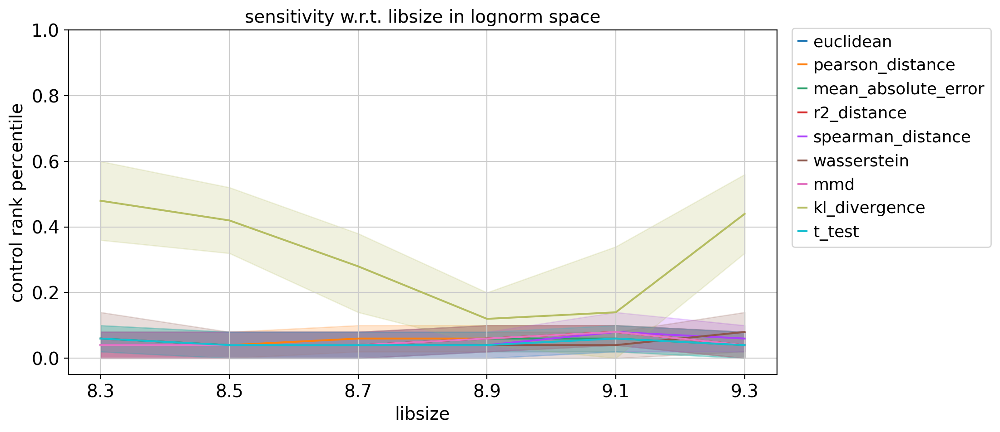

In [406]:
pwdfs, ctrl_ranks = plot(['libsize', 'lognorm'])

## summary table

### correlation with actual DE factors

Concatenate the _individual_ melted distance dataframes and label with metadata. Calculate and visualize change in distance due to sample size.

In [407]:
# get metadata
params = pd.read_csv('../splatter_sim_params.csv').reset_index()
params['perturbation'] = [f'Path{x}' for x in params['index'].values]
params.perturbation.replace({'Path1': 'control'}, inplace=True)

def annotate(df, params):
    # annotate
    for col in params.columns:
        df[col] = df['perturbation'].map(dict(zip(params.perturbation, params[col])))
    df = df.dropna()  # dropping fake controls

In [408]:
pwdfs, ctrl_ranks = plot(['n_cells', 'lognorm', '300'], plot=False)

In [409]:
df = get_melted_df_per_perturbation(pwdfs, metrics, controls, 'n_cells', reference='euclidean-300')
annotate(df, params)

Plot rankings together:

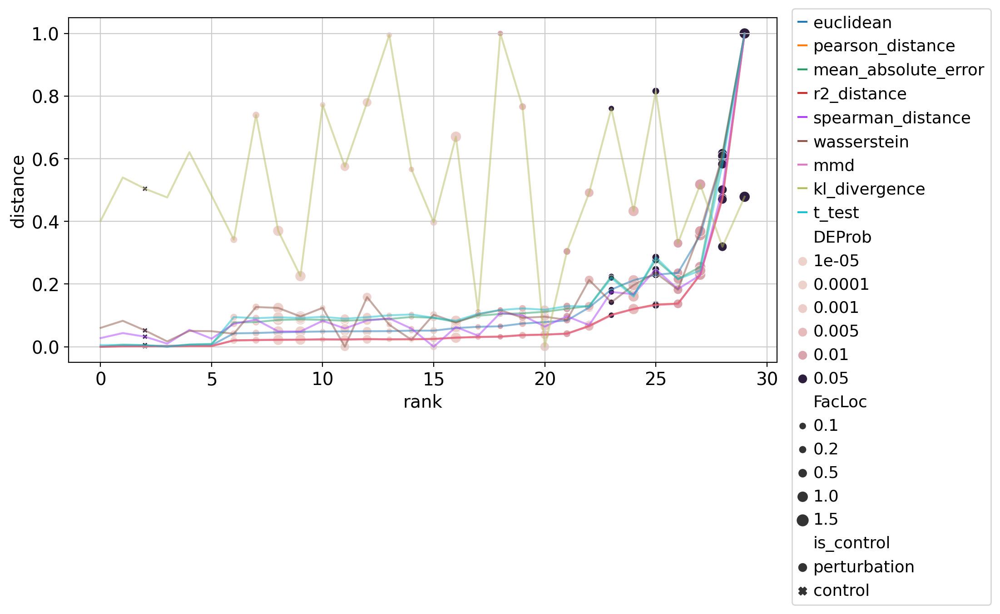

In [410]:
normed_df = normalize_per_metric(df, label='distance')
plt.figure(figsize=(10, 5))
sns.lineplot(data=normed_df, x='rank', y='distance', hue='metric', alpha=.5)
sns.scatterplot(data=normed_df, x='rank', y='distance', hue='DEProb', size='FacLoc', style='is_control')
plt.legend(bbox_to_anchor=(1.01, 1.05))

Calculate spearman correlation with DEProb per metric:

In [411]:
from scipy.stats import spearmanr

In [412]:
df = get_ranked_df_per_perturbation(pwdfs, metrics, controls, 'n_cells')
df = df[df.is_control == 'perturbation']
annotate(df, params)

In [413]:
sr = {}
for m in metrics:
    sub = df[df.metric == m]
    sr[m] = spearmanr(sub['distance'].values, sub.DEProb.values)[0]
corr_wreal = pd.DataFrame.from_dict(sr, orient='index').sort_values(0)
corr_wreal[0] = 1 - corr_wreal[0]  # flip so smaller is better
corr_wreal.columns = ['1-corr_DE']
corr_wreal

,1-corr_DE
kl_divergence,0.992951
wasserstein,0.400829
spearman_distance,0.214028
mean_absolute_error,0.164685
pearson_distance,0.154111
r2_distance,0.150587
mmd,0.147062
euclidean,0.147062
t_test,0.129439


### performance in the most realistic scenario

The most realistic scenario for evaluation is 5k highly variable genes, 300 cells per condition, no mislabeling and optimal library size.

In [414]:
pwdfs, ctrl_ranks = plot(['n_cells', 'lognorm'], plot=False)
best_case = ctrl_ranks[ctrl_ranks.n_cells == '300']

avg_rank = best_case[['rank', 'metric']].groupby('metric').mean().sort_values('rank')
avg_rank.columns = ['rank_mean']

var_rank = best_case[['rank', 'metric']].groupby('metric').var().sort_values('rank')*100
var_rank.columns = ['rank_var*100']

### summary

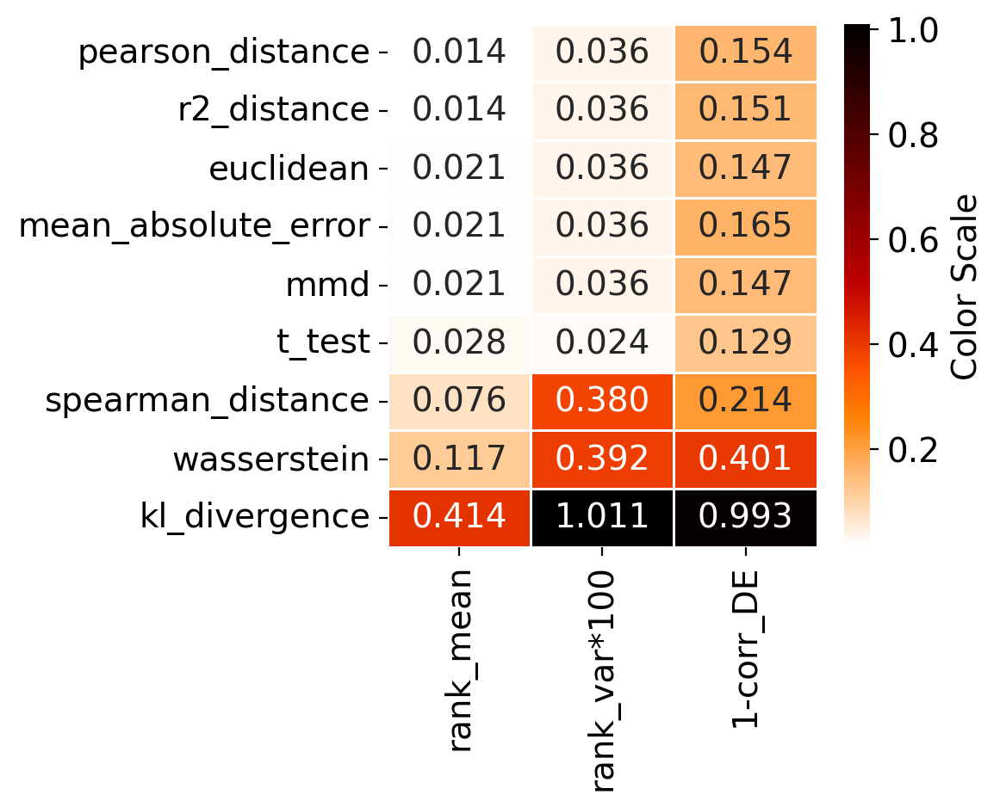

In [416]:
df = pd.concat([avg_rank, var_rank, corr_wreal], axis=1)
# df = df.apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)), axis=0)
sns.heatmap(df, annot=True, cmap='gist_heat_r', fmt=".3f", linewidths=.5, cbar_kws={'label': 'Color Scale'})
plt.grid(None)